# Supermarket Inventory counting for replinshment using Yolov5

## Setting up the environment

In [ ]:
import os
!git clone https://github.com/ultralytics/yolov5  # clone the yolov5 repo
!pip install -r yolov5/requirements.txt  # install all requirements to use yolov5
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Cloning into 'yolov5'...
remote: Enumerating objects: 8412, done.
remote: Counting objects: 100% (126/126), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 8412 (delta 64), reused 80 (delta 39), pack-reused 8286
Receiving objects: 100% (8412/8412), 9.53 MiB | 13.35 MiB/s, done.
Resolving deltas: 100% (5806/5806), done.
/content/yolov5
Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


## Download the data and unzip it using the roboflow generated code. 

In [ ]:
# Export code snippet and paste here
%cd /content
api_key = "Enter your roboflow dataset download key here"
!curl -L api_key > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1906      0 --:--:-- --:--:-- --:--:--  1906
100 53.9M  100 53.9M    0     0  56.1M      0 --:--:-- --:--:-- --:--:--  361M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/train_0_jpg.rf.6c16338f8fb6e8751d767346886c53a6.jpg  
 extracting: test/images/train_110_jpg.rf.486e4cc85a5f3cc3a071bbd2bd995622.jpg  
 extracting: test/images/train_128_jpg.rf.cda705db183f2b70659ae2542ef39c97.jpg  
 extracting: test/images/train_133_jpg.rf.81691368a2238de68a0926ba0b469a11.jpg  
 extracting: test/images/train_136_jpg.rf.bb25a97287057f6380bee720f8975add.jpg  
 extracting: test/images/train_141_jpg.rf.aee13e4a9acaea42e2f1b0020c0408b8.jpg  
 extracting: test/images/train_149_jpg.rf.ec96f

## Define Model Configuration and Architecture

We will be using the pre trained model and it's architecture: Yolov5s. We will only be changing the number of classes to 1.


In [ ]:
import yaml
with open('/content/yolov5/models/yolov5s.yaml', 'r') as file:
  doc = file.readlines()
  file.close()

%cd /content/
with open('yolov5/models/custom_yolov5s.yaml', 'w') as file:
  file.write('# Parameters\n')
  file.write('nc: 1  # number of classes\n')
  for line in doc[2:]:
    file.write(line)
  file.close()



/content


In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 32 --epochs 300 --data '../data.yaml' --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name yolov5s_results --nosave --cache


/content/yolov5
train: weights=, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=300, batch_size=32, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-316-g8acb573 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,

## Evaluate Custom YOLOv5 Detector Performance

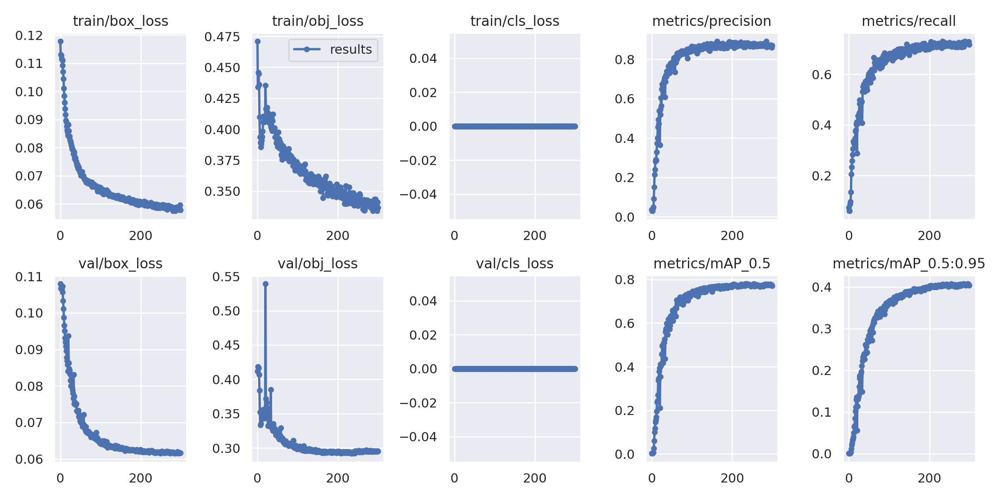

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width = 1000)  # visualize the training progress

## Training set images with annotations

ORIGINAL TRAINING DATA:


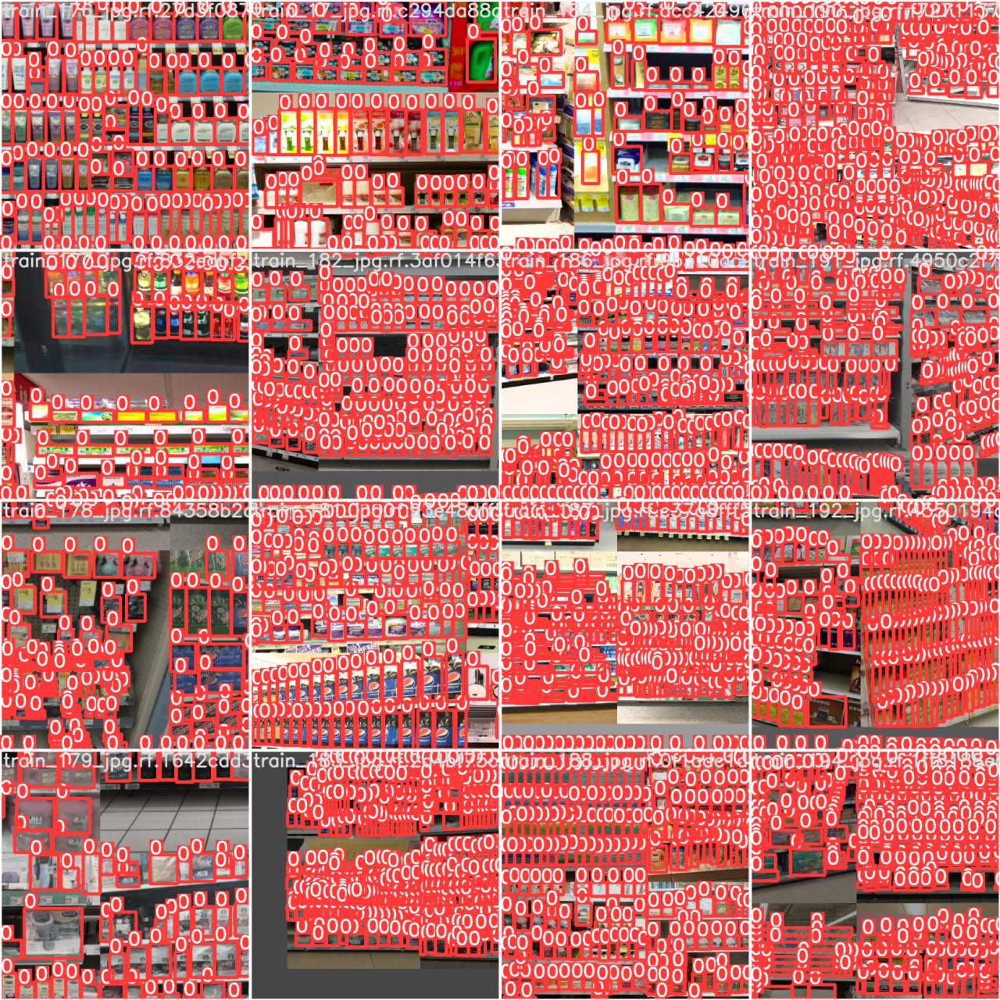

In [ ]:
# View some of the training images with annotations
print("ORIGINAL TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch2.jpg', width = 900)

## Predictions

Let us now test our trained model on some of the test images

In [ ]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/last.pt --img 416 --hide-labels --hide-conf --conf 0.4 --source ../test/images


/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/last.pt'], source=../test/images, imgsz=416, conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=True, half=False
YOLOv5 🚀 v5.0-316-g8acb573 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 224 layers, 7053910 parameters, 

### Bounding boxes predicted by our trained YOLOv5 model on test set images

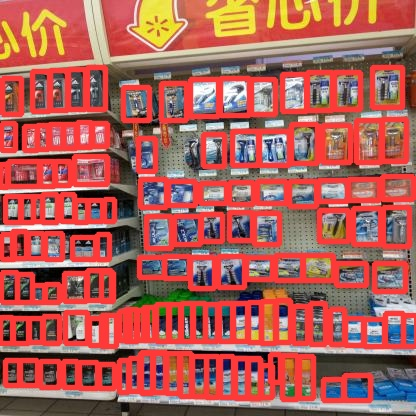

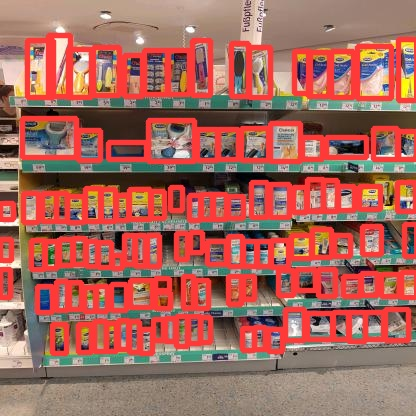

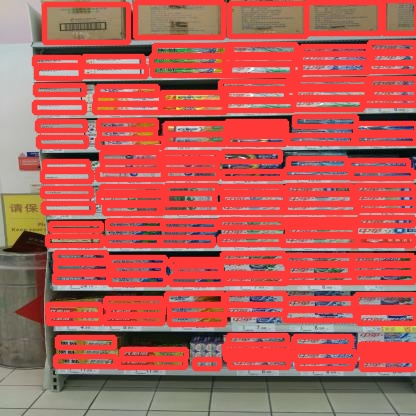

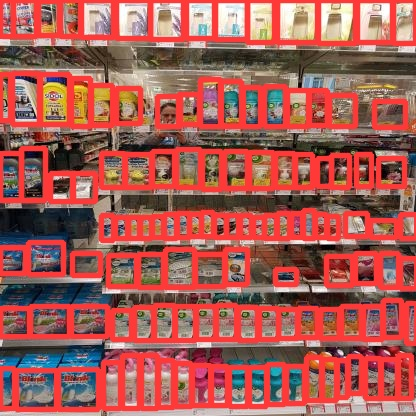

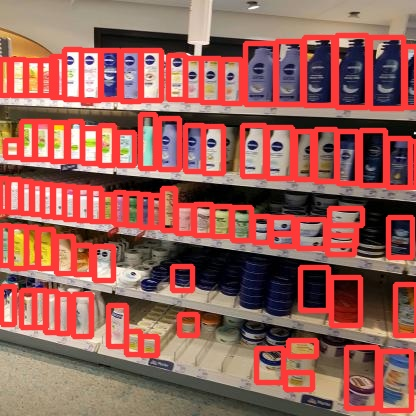

...

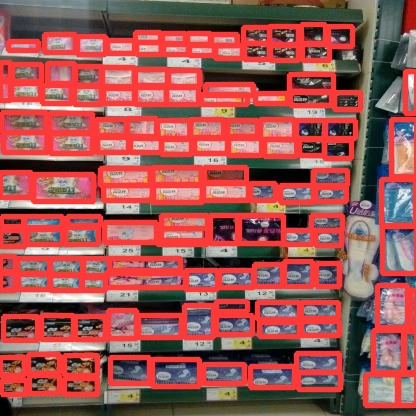

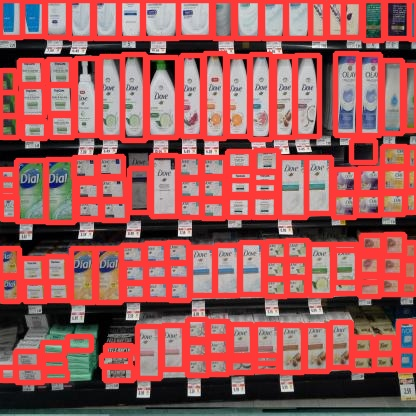

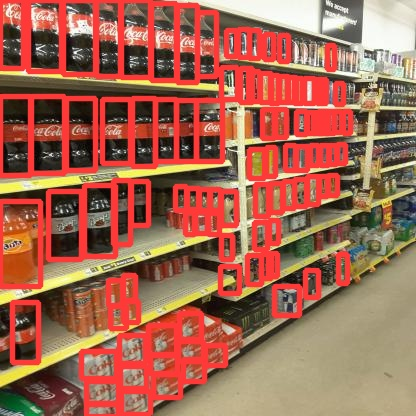

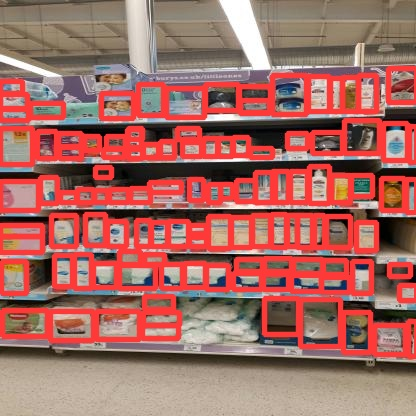

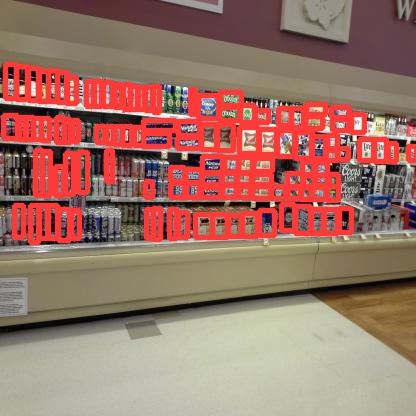

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")